In [1]:
# Import main packages
import sys, os
sys.path.insert(1, os.path.abspath('..') )
from ECO import diagnostics as eco
from ECO.utils import config_parser, open_datasets, get_namelist
import xarray as xr
import xgcm
import numpy as np

# Import matplotlib for plotting and functions to override default values
import matplotlib.pyplot as plt
from plot_utils import update_plotstyle, cmap_OB
cmap_OB=cmap_OB(); update_plotstyle()

In [ ]:
kwargs_proc, kwargs_pre, kwargs_sim = config_parser("EXP00", exp_suffix="_1d10", log=True)
ds = open_datasets(kwargs_proc['exp_out'], kwargs_proc['exp_out_suffix'], components = ['all'])

In [2]:
exp_prefix = ['EXP00','EXP01'] # Import all files with this prefix
exp_suffix = ['_5d50','_5d50']
ds = open_datasets(exp_prefix, exp_suffix, components = ['postprocessed','metrics', 'masks','properties'])#, compat='override', coords='minimal')
if type(ds) != dict: ds={exp_prefix+exp_suffix:ds}

HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 494 in H5O__attr_open_by_name(): can't locate attribute: '_QuantizeBitGroomNumberOfSignificantDigits'
    major: Attribute
    minor: Object not found
HDF5-DIAG: Error detected in HDF5 (1.12.2) MPI-process 0:
  #000: H5A.c line 5

In [3]:
# get base configuration of EXP00
kwargs={}
#kwargs[exp_prefix+exp_suffix] = config_parser(exp_prefix)
for i in range(len(exp_prefix)): kwargs[exp_prefix[i]+exp_suffix[i]] = config_parser(exp_prefix[i])
#for exp in exp_suffix: kwargs[exp_prefix+exp] = config_parser(exp_prefix)
#if kwargs_sim['get_namelist']: kwargs_sim['namelist'] = get_namelist(path = kwargs_proc['path_nemo'])

# define xgcm configuration based on dataset metrics
_metrics = {('X',): ['e1tm', 'e1um', 'e1vm', 'e1fm'],
     ('Y',): ['e2tm', 'e2um', 'e2vm', 'e2fm'],
     ('Z',): ['e3tm', 'e3um', 'e3vm', 'e3wm']}

grid = {exp: xgcm.Grid(ds[exp], metrics=_metrics, periodic=False) for exp in ds} # define xgcm grid
grid_ops = {exp: eco.Grid_ops(grid[exp], maskargs={'mask':'nan'}) for exp in ds} # define gridoperations.
grid = {exp: grid_ops[exp]._update({'Z':ds[exp]['e3tm_1d']}) for exp in ds}
        
properties= {exp: eco.Properties(grid_ops[exp], {'X': ds[exp].glamt, 'Y': ds[exp].gphit, 'Z': ds[exp].depth_1d}, eos_properties=kwargs[exp][2]['eos']) for exp in ds}
energetics= {exp: eco.Energetics(grid_ops[exp], properties[exp]) for exp in ds}

Using processing configuration base.yml
Using processing configuration base.yml


In [52]:
#vars = ['KN2_convective','KN2_diffusive','C']#'Gh_surf','Gh_hdiff','Gh_qsr','C']
magn=1e9
vars_gm = {exp:{} for exp in ds}
for exp in ds:
    vars_gm[exp]['Convection'] = -properties[exp].global_mean(ds[exp]['KN2_convective']*magn, Vmask=ds[exp].mask_bd_w).compute()
    vars_gm[exp]['Gh_hdiff'] = properties[exp].global_mean(ds[exp]['Gh_hdiff']*magn, Vmask=ds[exp].mask_bd_t).compute()
    vars_gm[exp]['Gh_qsr'] = properties[exp].global_mean(ds[exp]['Gh_hdiff']*magn, Vmask=ds[exp].mask_bd_t).compute()
    vars_gm[exp]['Diffusion'] = (-properties[exp].global_mean(ds[exp]['KN2_diffusive']*magn, Vmask=ds[exp].mask_bd_w)).compute()
    vars_gm[exp]['Diffusion_tot'] = (-properties[exp].global_mean(ds[exp]['KN2_diffusive']*magn, Vmask=ds[exp].mask_bd_w)
    + ds[exp]['Gh_surf']*magn + vars_gm[exp]['Gh_hdiff'] + vars_gm[exp]['Gh_qsr']).compute()
    vars_gm[exp]['Conversion'] = properties[exp].global_mean(ds[exp]['C']*magn, Vmask=ds[exp].mask_bd_t).compute()
    
for exp in ds:    
    for var in vars_gm[exp]:
        print(var, '[1e-9m/s]')
        print('{:.4f}'.format(vars_gm[exp][var].mean('t').values))
    

Convection [1e-9m/s]
-0.0184
Gh_hdiff [1e-9m/s]
0.0084
Gh_qsr [1e-9m/s]
0.0084
Diffusion [1e-9m/s]
0.2046
Diffusion_tot [1e-9m/s]
1.4518
Conversion [1e-9m/s]
-0.0076
Convection [1e-9m/s]
-0.0147
Gh_hdiff [1e-9m/s]
0.0082
Gh_qsr [1e-9m/s]
0.0082
Diffusion [1e-9m/s]
0.2225
Diffusion_tot [1e-9m/s]
1.4560
Conversion [1e-9m/s]
-0.0165


In [3]:
mean=int(360/5)
ds['EXP01_5d50']['Diffusion_tot']=ds['EXP01_5d50']['KN2_diffusive_gm']+ds['EXP01_5d50']['Gh_hdiff_gm']+ds['EXP01_5d50']['Gh_surf_gm']+ds['EXP01_5d50']['Gh_qsr_gm']
#(ds['EXP01_5d50']['KN2_convective_gm']).rolling({'t':mean}).mean('t').plot()
#(ds['EXP01_5d50']['C_gm']).rolling({'t':mean}).mean('t').plot()
#(ds['EXP01_5d50']['Gh_hdiff_gm']).rolling({'t':mean}).mean('t').plot()
#(ds['EXP01_5d50']['Gh_surf_gm']).rolling({'t':mean}).mean('t').plot()
#(ds['EXP01_5d50']['Gh_qsr_gm']).rolling({'t':mean}).mean('t').plot()
#(ds['EXP01_5d50']['KN2_diffusive_gm']).rolling({'t':mean}).mean('t').plot()
(ds['EXP01_5d50']['Diffusion_tot']+ds['EXP01_5d50']['KN2_convective_gm']+ds['EXP01_5d50']['C_gm']).rolling({'t':mean}).mean('t').plot()


dzg_tot=(ds['EXP01_5d50'].zgDE.diff('t').rolling({'t':2}).mean('t')/(60*60*24*360/72)).rolling({'t':mean}).mean('t')#*1e9
dzg_tot.plot()

In [16]:
#vars = ['KN2_convective','KN2_diffusive','C']#'Gh_surf','Gh_hdiff','Gh_qsr','C']
magn=1e10
vars = {exp:{} for exp in ds}
for exp in ds:
    vars[exp]['Convection'] = -grid_ops[exp].average(ds[exp]['KN2_convective']*magn, 'X')
    vars[exp]['Diffusion'] = -grid_ops[exp].average(ds[exp]['KN2_diffusive']*magn, 'X')
    + ds[exp]['Gh_surf']*magn
    + grid_ops[exp].average(ds[exp]['Gh_hdiff']*magn, 'X')
    + grid_ops[exp].average(ds[exp]['Gh_qsr']*magn, 'X')
    vars[exp]['Conversion'] = grid_ops[exp].average(ds[exp]['C']*magn, 'X' )
    
    # for var in vars:
    #     print(var, '[1e-9m/s]')
    #     time_means = []
    #     for time in [(0,20), (20,400), (400,3000)]:
    #         time_means.append(vars[var][slice(*time)].mean('t').values*magn)
    #     print('{:.4f}  {:.4f}  {:.4f}'.format(*time_means))
    

In [13]:
#exp = 'EXP00_5d50'
#path_to_dataset = 'data/'+exp+'/' # Here chosen as relative path, adjust if notebook is executed outside of 
#file_name_proc = exp+'_proc*'       # Import all files with this prefix
#file_name_pre = exp+'_pre*'       # Import all files with this prefix
#ds     = xr.open_mfdataset(path_to_dataset+file_name_proc, decode_times=False, parallel=True, data_vars='minimal', compat='override', coords='minimal') 
#ds_raw = xr.open_mfdataset(path_to_dataset+file_name_pre,  decode_times=False, parallel=True, data_vars='minimal') 

# get configuration from processing for matching parameters
#kwargs_proc, kwargs_pre, kwargs_sim = config_parser(config_path='../ECOprocessing/Configs/'+exp, sub_config='sub_5d50')

#kwargs[exp_prefix+exp_suffix] = config_parser(exp_prefix)
kwargs={}
for i in range(len(exp_prefix)): kwargs[exp_prefix[i]+exp_suffix[i]] = config_parser(exp_prefix[i])
# define xgcm configuration based on dataset metrics
_metrics = {('X',): ['e1tm', 'e1um', 'e1vm', 'e1fm'],
     ('Y',): ['e2tm', 'e2um', 'e2vm', 'e2fm'],
     ('Z',): ['e3tm', 'e3um', 'e3vm', 'e3wm']}

grid = xgcm.Grid(ds, metrics=_metrics, periodic=False) # define xgcm grid
grid_ops = eco.Grid_ops(grid, maskargs={'mask':'nan'}) # define gridoperations. With {'mask':'nan'} operations apply a nan-mask, replacing 0 by nan in data

# define coordinates to pass to diagnostics
_coords = {'X': ds.glamt,
           'Y': ds.gphit, 
           'Z': ds.depth_1d}

properties= eco.Properties(grid_ops, _coords, eos_properties=kwargs_sim['eos'])
energetics= eco.Energetics(grid_ops, properties)
energetics_trend= eco.Energetics_trends(grid_ops,properties,
                                             '../ECOdiagnostics/diagnostics/defaults/processes.ini')

Using processing configuration base.yml
Using processing configuration base.yml


AttributeError: 'dict' object has no attribute 'dims'

In [5]:

phi = ds['EXP00_5d50'].gphit[:,0]
lam = ds['EXP00_5d50'].glamt[0,:]
depth = properties['EXP00_5d50'].coords['Z']
YZ,ZY = np.meshgrid(phi.values,depth.values[:-1])
XY,YX = np.meshgrid(lam.values,phi.values)

/proj/climategu/users/x_bensc/Analysis/venv/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/proj/climategu/users/x_bensc/Analysis/venv/lib/python3.10/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


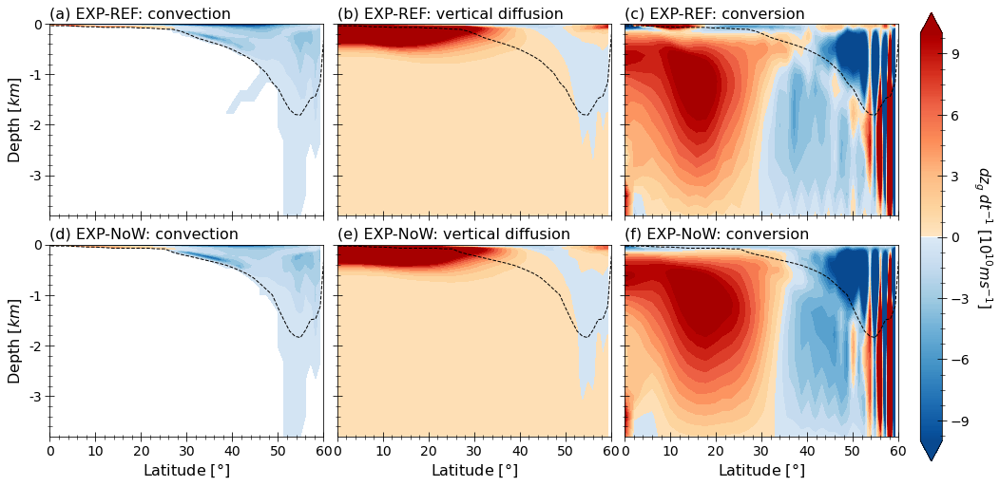

In [9]:
%matplotlib inline
from matplotlib.cm import ScalarMappable

exp = list(ds.keys())[0]
phi = ds[exp].gphit[:,0]
lam = ds[exp].glamt[0,:]
depth = properties[exp].coords['Z']
YZ,ZY = np.meshgrid(phi.values,depth.values[:-1])
XY,YX = np.meshgrid(lam.values,phi.values)

fig,ax=plt.subplots(2,3,figsize=(16,8))

for i, exp in enumerate(ds):
    magn = 1e10
    #KN2_convective = grid_ops[exp].average( 1/(9.81)*KN2_h_bot_to_top_convective[exp]*magn,'X').compute()  
    #KN2_diffusive = grid_ops[exp].average( 1/(9.81)*KN2_h_bot_to_top_diffusive[exp]*magn,'X').compute()
    #Gh_hdiff = grid_ops[exp].average( 1/(9.81)*(GhT_hdiffusion_gm[exp]+GhS_hdiffusion_gm[exp])*magn,'X').compute()
    #Gh_qsr = grid_ops[exp].average( 1/(9.81)*(GhT_qsr3d[exp]).rolling({'t':2}).mean('t')*magn,'X').compute()
    #C= grid_ops[exp].average((ds[exp].dzg_Kconvp2k).rolling({'t':2}).mean('t').rolling({'y_c':2}).mean('y_c')*1e9,'X').compute()

    # proc=grid_ops[exp].average(-KN2_h_w[exp]*1e9,'X').mean('t')
    # cont_C=grid_ops[exp].average(-KN2_h_w_avt[exp]*1e9,'X').mean('t')
    # cont_D=grid_ops[exp].average(-KN2_h_w_avt_inv[exp]*1e9,'X').mean('t')
    
    # cticks=np.linspace(-10,10,21)
    # c1=ax[i,0].contourf(YZ,ZY,proc[:-1],cmap=cmap_OB,extend='both',levels=cticks)
    # c2=ax[i,1].contourf(YZ,ZY,cont_C[:-1],cmap=cmap_OB,extend='both',levels=cticks)
    # c3=ax[i,2].contourf(YZ,ZY,cont_D[:-1],cmap=cmap_OB,extend='both',levels=cticks)

    cticks=np.linspace(-10,10,21)
    Diffusion=(ds[exp]['KN2_diffusive_yz']+ds[exp]['Gh_surf_yz']+ds[exp]['Gh_hdiff_yz']+ds[exp]['Gh_qsr_yz']).mean('t').compute()[:-1]
    c2=ax[i,0].contourf(YZ,ZY,(ds[exp]['KN2_convective_yz']).mean('t')[:-1]*magn,cmap=cmap_OB,extend='both',levels=cticks)
    c1=ax[i,1].contourf(YZ,ZY,ds[exp]['KN2_diffusive_yz'].mean('t')[:-1]*magn,cmap=cmap_OB,extend='both',levels=cticks)
    #c3=ax[i,2].contourf(YZ,ZY,(Gh_hdiff).mean('t')[:-1],cmap=cmap_OB,extend='both',levels=cticks)
    c4=ax[i,2].contourf(YZ,ZY,(ds[exp]['C_yz']).mean('t')[:-1]*magn,cmap=cmap_OB,extend='both',levels=cticks)


    #mld_mean  = grid_ops[exp].average(ds[exp].mld ,'X')
    maxidm_mean = grid_ops[exp].average(ds[exp].mld ,'X').fillna(0).mean('y_c').argmax('t').values
    
    mld_mean  = ds[exp].mld.max('x_c').mean('t')
    #mld_max  = ds[exp].mld.max('x_c')[maxidm_mean]
    for j in range(3):
        #ax[i,j].plot(grid_ops[exp].average(ds[exp].mld,'X').mean('t'), c='k', linewidth=0.5)
        ax[i,j].plot(phi, -mld_mean, c='k', linewidth=1, linestyle='--')
        #ax[i,j].plot(phi, -mld_max, c='grey', linewidth=1, linestyle='--')
        ax[i,j].set_yticks([-4000,-3000,-2000,-1000,0])
        ax[i,j].set_yticklabels([0,-1,-2,-3,-4][::-1])
        ax[i,j].set_xlim(0,60)
        ax[i,j].set_ylim(-3800,0)
        ax[0,j].set_xticklabels([])        
        ax[1,j].set_xlabel('Latitude $[°]$',fontsize=16)
        if j>0: ax[i,j].set_yticklabels([])
    
ax_cb=fig.add_axes([0.92, 0.08, 0.02, 0.82])
cbar=plt.colorbar(ScalarMappable(norm=c1.norm, cmap=c1.cmap),ax=ax_cb,cax=ax_cb,
            ticks=np.arange(-9, 10, 3),
            extend='both', pad=0.02)
cbar.set_label(r'$dz_g\;dt^{-1}$ [$10^{10}m s^{-1}$]',rotation=-90,labelpad=25,fontsize=15)
# ax[0,0].set_title("Convection")
# ax[0,1].set_title("v. diffusion")
# ax[0,2].set_title("Conversion")
ax[0,0].set_ylabel('Depth $[km]$',fontsize=16)
ax[1,0].set_ylabel('Depth $[km]$',fontsize=16)
ax[0,0].set_title('(a) EXP-REF: convection',fontsize=16, loc='left')
ax[0,1].set_title('(b) EXP-REF: vertical diffusion',fontsize=16, loc='left')
ax[0,2].set_title('(c) EXP-REF: conversion',fontsize=16, loc='left')
ax[1,0].set_title('(d) EXP-NoW: convection',fontsize=16, loc='left')
ax[1,1].set_title('(e) EXP-NoW: vertical diffusion',fontsize=16, loc='left')
ax[1,2].set_title('(f) EXP-NoW: conversion',fontsize=16, loc='left')

# ax[0,0].annotate('EXP-REF',[-0.25,0.35],xycoords='axes fraction',
#                  fontweight='bold',fontsize=16,rotation=90)
# ax[1,0].annotate('EXP-NoW',[-0.25,0.34],
#                  fontweight='bold',xycoords='axes fraction',fontsize=16,rotation=90)
plt.subplots_adjust(wspace=0.05, hspace=0.15)

plt.savefig('figures/Fig6_final.png', transparent=True, dpi=300)

# ax[i,0].set_title("KN$_h^2$ - Total (1e-10)")
# ax[i,1].set_title("KN$_h^2$ - Convective (1e-9)")
# ax[i,2].set_title("KN$_h^2$ - Diffusive (1e-10)")
#plt.contour(YZ,ZY,cont_C[:-1],extend='both',levels=[-10,0,10],colors='k',alpha=.5,linewidths=1)
#plt.contour(YZ,ZY,cont_D[:-1],extend='both',levels=[-10,0,10],colors='g',alpha=.5,linewidths=1)

<Figure size 864x576 with 0 Axes>

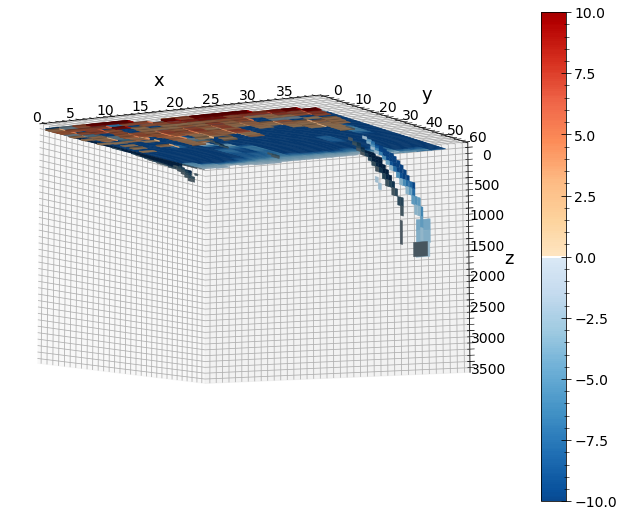

In [13]:
import matplotlib 
norm=matplotlib.colors.Normalize(vmin=-10,vmax=10)
scalarMap = matplotlib.cm.ScalarMappable(norm=norm, cmap=cmap_OB)

def get_rgb3d(proc):
    colors=np.zeros(proc.shape+(4,))#proc.copy().expand_dims('c':).values
    for i in range(colors.shape[0]):
        colors[i]=scalarMap.to_rgba(proc[i])
    return colors

fig=plt.figure(figsize=(12,8))
ax = plt.figure().add_subplot(projection='3d')

x3d=ds['EXP00_5d50'].glamu.expand_dims({'z_c':ds['EXP00_5d50'].z_c})
y3d=ds['EXP00_5d50'].gphiv.expand_dims({'z_c':ds['EXP00_5d50'].z_c})
#z3d=ds.gdepw_0
z3d=ds['EXP00_5d50'].gdept_0

proc = (-KN2_h_w_avt['EXP00_5d50']*1e9).mean('t')
proc_threshold = np.logical_or(proc<-2,proc>2)
colors=get_rgb3d(proc.where(proc_threshold))
proc_plot=proc#.where(proc_threshold)
ax.voxels(x3d, y3d, z3d, proc_plot[1:,1:,1:],
          facecolors=colors[1:,1:,1:],
          edgecolors=colors[1:,1:,1:],  # brighter
          linewidth=0.5)
ax.set(xlabel='x', ylabel='y', zlabel='z',zlim3d=(3600,0),xlim3d=(0,38),ylim3d=(0,60))

ax.view_init(-7,-60)
plt.colorbar(scalarMap,ax=ax)

<Figure size 864x576 with 0 Axes>

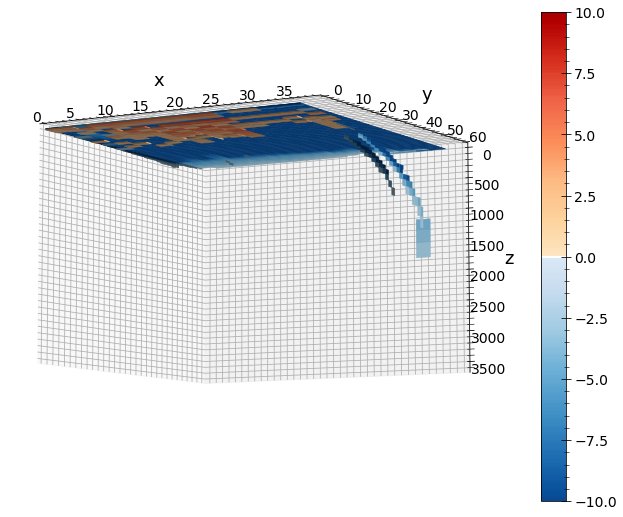

In [14]:
import matplotlib 
norm=matplotlib.colors.Normalize(vmin=-10,vmax=10)
scalarMap = matplotlib.cm.ScalarMappable(norm=norm, cmap=cmap_OB)

def get_rgb3d(proc):
    colors=np.zeros(proc.shape+(4,))#proc.copy().expand_dims('c':).values
    for i in range(colors.shape[0]):
        colors[i]=scalarMap.to_rgba(proc[i])
    return colors

fig=plt.figure(figsize=(12,8))
ax = plt.figure().add_subplot(projection='3d')

x3d=ds['EXP00_5d50'].glamu.expand_dims({'z_c':ds['EXP00_5d50'].z_c})
y3d=ds['EXP00_5d50'].gphiv.expand_dims({'z_c':ds['EXP00_5d50'].z_c})
#z3d=ds.gdepw_0
z3d=ds['EXP00_5d50'].gdept_0

proc = (-KN2_h_w_avt['EXP01_5d50']*1e9).mean('t')
proc_threshold = np.logical_or(proc<-2,proc>2)
colors=get_rgb3d(proc.where(proc_threshold))
proc_plot=proc#.where(proc_threshold)
ax.voxels(x3d, y3d, z3d, proc_plot[1:,1:,1:],
          facecolors=colors[1:,1:,1:],
          edgecolors=colors[1:,1:,1:],  # brighter
          linewidth=0.5)
ax.set(xlabel='x', ylabel='y', zlabel='z',zlim3d=(3600,0),xlim3d=(0,38),ylim3d=(0,60))

ax.view_init(-7,-60)
plt.colorbar(scalarMap,ax=ax)

## Process contribution

In [7]:
for var in ds['EXP00_5d50']: print(var) if 'dzg' in var else None

dzg_tot
dzg_Ttot
dzg_Txad
dzg_Tyad
dzg_Tzad
dzg_Tldf
dzg_Tzdf
dzg_Tqns
dzg_Tqsr
dzg_Tatf
dzg_Stot
dzg_Sxad
dzg_Syad
dzg_Szad
dzg_Sldf
dzg_Szdf
dzg_Scdt
dzg_Satf
dzg_Kconvp2k


In [7]:
processComb = {exp: {'Mixing': ds[exp].dzg_Tzdf+ds[exp].dzg_Szdf+ds[exp].dzg_Tldf+ds[exp].dzg_Sldf,
                     'Conversion': ds[exp].dzg_Kconvp2k,
                     'KN2': KN2_h_w_avt[exp],
                     'KN2_inv': KN2_h_w_avt_inv[exp]} 
                     for exp in ds}
#processCombGM = {exp: {var: properties[exp].global_mean(processComb[exp][var], Vmask=ds[exp].mask_bd_t).compute() for var in processComb[exp]} for exp in ds}

In [8]:
properties['EXP00_5d50'].global_mean(processComb['EXP00_5d50']['KN2'], Vmask=ds['EXP00_5d50'].mask_bd_t).compute()

: 

: 

In [ ]:
processCombGM_smooth = {exp: {var: processCombGM[exp][var].rolling({'t':72}).mean('t').compute() for var in processCombGM[exp]} for exp in ds}

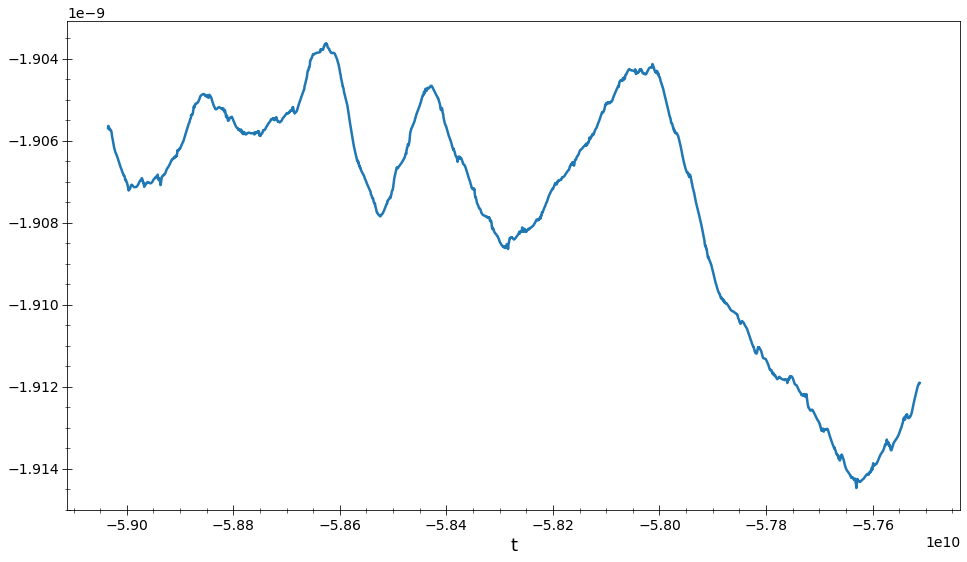

In [ ]:
#processCombGM_smooth['EXP00_5d50']['KN2'].plot()
processCombGM_smooth['EXP00_5d50']['KN2_inv'].plot()

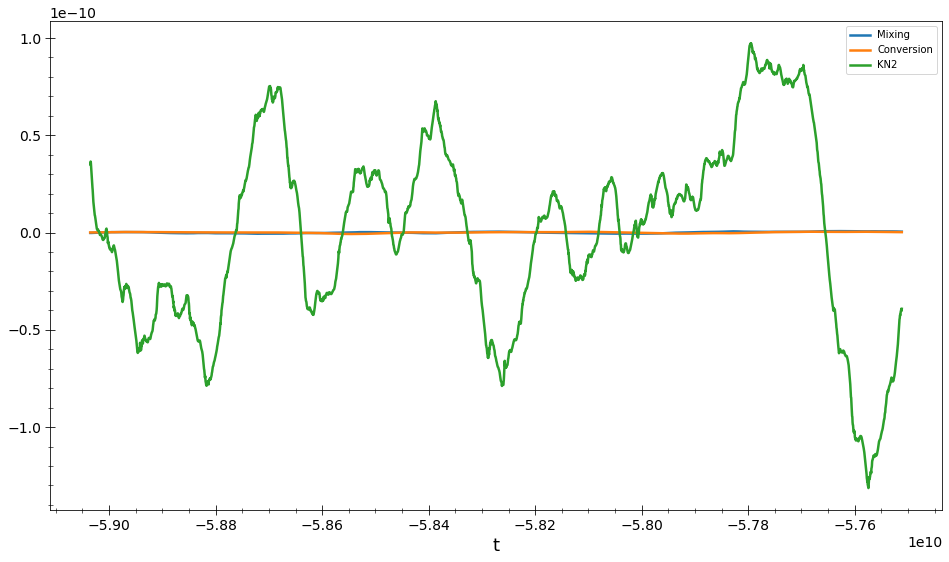

In [ ]:
for var in processCombGM_smooth['EXP00_5d50']:
    (processCombGM_smooth['EXP00_5d50'][var]-processCombGM_smooth['EXP00_5d50'][var].mean('t')).plot(label=var)
plt.legend()
#(zdf_cont['EXP01_5d50']-zdf_cont['EXP01_5d50'].mean('t')).plot()
#properties['EXP00_5d50'].global_mean(ds['EXP00_5d50'].dzg_Tzdf).plot()

In [41]:
from statsmodels.nonparametric.smoothers_lowess import lowess
dmoc = {exp: np.transpose(lowess(ds[exp].psi_dmoc, ds[exp].t,frac=0.05))[1] for exp in ds}

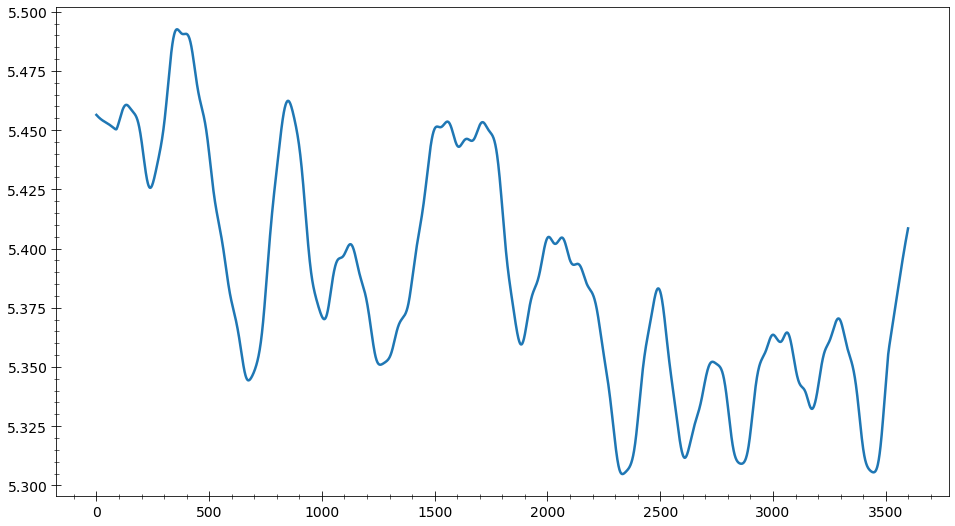

In [44]:
plt.plot(dmoc['EXP00_5d50'])